# Package Imports

In [1]:
# Package Imports

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Input, Model
from tensorflow.keras.layers import ZeroPadding2D, Conv2D, BatchNormalization, ReLU
from tensorflow.keras.layers import DepthwiseConv2D, Add, GlobalAveragePooling2D, Dense
from tensorflow.keras.utils import to_categorical

import numpy as np
print(tf.__version__) 

2.11.0


# Create the Model (MobileNet V2)

In [2]:
# ============================================================================== #

# ````````````````````````````` Model creation `````````````````````````````
# You can replace this section with other models from here: 
# https://github.com/melvincabatuan/keras-idiomatic-programmer/tree/master/zoo 

# MobileNet v2 (2019)
# Paper: https://arxiv.org/pdf/1801.04381.pdf
# 224x224 input: 3,504,872 parameters

# ============================================================================== #

def stem(inputs, alpha):
    """ Construct the Stem Group
        inputs : input tensor
        alpha  : width multiplier
    """
    # Calculate the number of filters for the stem convolution
    # Must be divisible by 8
    n_filters = max(8, (int(32 * alpha) + 4) // 8 * 8)
    
    # Convolutional block
    x = ZeroPadding2D(padding=((0, 1), (0, 1)))(inputs)
    x = Conv2D(n_filters, (3, 3), strides=(2, 2), padding='valid', use_bias=False, kernel_initializer='glorot_uniform')(x)
    x = BatchNormalization()(x)
    x = ReLU(6.)(x)

    return x
    
def learner(x, alpha, expansion=6):
    """ Construct the Learner
        x        : input to the learner
        alpha    : width multiplier
        expansion: multipler to expand number of filters
    """
    # First Inverted Residual Convolution Group
    x = group(x, 16, 1, alpha, expansion=1, strides=(1, 1))
    
    # Second Inverted Residual Convolution Group
    x = group(x, 24, 2, alpha, expansion)

    # Third Inverted Residual Convolution Group
    x = group(x, 32, 3, alpha, expansion)
    
    # Fourth Inverted Residual Convolution Group
    x = group(x, 64, 4, alpha, expansion)
    
    # Fifth Inverted Residual Convolution Group
    x = group(x, 96, 3, alpha, expansion, strides=(1, 1))
    
    # Sixth Inverted Residual Convolution Group
    x = group(x, 160, 3, alpha, expansion)
    
    # Seventh Inverted Residual Convolution Group
    x = group(x, 320, 1, alpha, expansion, strides=(1, 1))
    
    # Last block is a 1x1 linear convolutional layer,
    # expanding the number of filters to 1280.
    x = Conv2D(1280, (1, 1), use_bias=False, kernel_initializer='glorot_uniform')(x)
    x = BatchNormalization()(x)
    x = ReLU(6.)(x)
    return x
    
def group(x, n_filters, n_blocks, alpha, expansion=6, strides=(2, 2)):
    """ Construct an Inverted Residual Group
        x         : input to the group
        n_filters : number of filters
        n_blocks  : number of blocks in the group
        alpha     : width multiplier
        expansion : multiplier for expanding the number of filters
        strides   : whether first inverted residual block is strided.
    """   
    # In first block, the inverted residual block maybe strided - feature map size reduction
    x = inverted_block(x, n_filters, alpha, expansion, strides=strides)
    
    # Remaining blocks
    for _ in range(n_blocks - 1):
        x = inverted_block(x, n_filters, alpha, expansion, strides=(1, 1))
    return x

def inverted_block(x, n_filters, alpha, expansion=6, strides=(1, 1)):
    """ Construct an Inverted Residual Block
        x         : input to the block
        n_filters : number of filters
        alpha     : width multiplier
        strides   : strides
        expansion : multiplier for expanding number of filters
    """
    # Remember input
    shortcut = x

    # Apply the width filter to the number of feature maps for the pointwise convolution
    filters = int(n_filters * alpha)
    
    n_channels = int(x.shape[3])
    
    # Dimensionality Expansion (non-first block)
    if expansion > 1:
        # 1x1 linear convolution
        x = Conv2D(expansion * n_channels, (1, 1), padding='same', use_bias=False, kernel_initializer='glorot_uniform')(x)     
        x = BatchNormalization()(x)
        x = ReLU(6.)(x)

    # Strided convolution to match number of filters
    if strides == (2, 2):
        x = ZeroPadding2D(padding=((0, 1), (0, 1)))(x)
        padding = 'valid'
    else:
        padding = 'same'

    # Depthwise Convolution
    x = DepthwiseConv2D((3, 3), strides, padding=padding, use_bias=False, kernel_initializer='glorot_uniform')(x)
    x = BatchNormalization()(x)
    x = ReLU(6.)(x)

    # Linear Pointwise Convolution
    x = Conv2D(filters, (1, 1), strides=(1, 1), padding='same', use_bias=False, kernel_initializer='glorot_uniform')(x)
    x = BatchNormalization()(x)
    
    # Number of input filters matches the number of output filters
    if n_channels == filters and strides == (1, 1):
        x = Add()([shortcut, x]) 
    return x

def classifier(x, n_classes):
    """ Construct the classifier group
        x         : input to the classifier
        n_classes : number of output classes
    """
    # Flatten the feature maps into 1D feature maps (?, N)
    x = GlobalAveragePooling2D()(x)

    # Dense layer for final classification
    x = Dense(n_classes, activation='softmax', kernel_initializer='glorot_uniform')(x)
    return x

## Model Instantiation

In [3]:
# Model

def get_model(input_shape): # e.g. (224, 224, 3) 

    # Meta-parameter: width multiplier (0 .. 1) for reducing number of filters.
    alpha = 1

    # Meta-parameter: multiplier to expand number of filters
    expansion = 6

    inputs = Input(shape=input_shape)

    # The Stem Group
    x = stem(inputs, alpha)    

    # The Learner
    x = learner(x, alpha, expansion)

    # The classifier for 1000 classes
    outputs = classifier(x, 1000)

    # Instantiate the Model
    model = Model(inputs, outputs)
    
    return model

## Model Compilation

In [4]:
# Prepare the model
input_shape = (32, 32, 3)
model = get_model(input_shape)
model.compile(optimizer="adam",
              loss="sparse_categorical_crossentropy",
              metrics=["accuracy"])

## Model Summary

In [5]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 33, 33, 3)   0           ['input_1[0][0]']                
                                                                                                  
 conv2d (Conv2D)                (None, 16, 16, 32)   864         ['zero_padding2d[0][0]']         
                                                                                                  
 batch_normalization (BatchNorm  (None, 16, 16, 32)  128         ['conv2d[0][0]']                 
 alization)                                                                                   

# Visualize the model

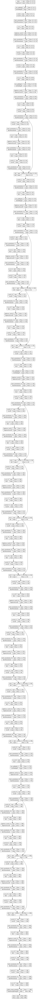

In [6]:
from IPython.display import Image
from keras.utils.vis_utils import plot_model

plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)
Image('model.png')

# Preparing the dataset

CIFAR10 small images classification dataset is composed of 50,000 32x32 color training images and 10,000 test images, labeled over 10 categories. See more info at the CIFAR homepage ( https://www.cs.toronto.edu/~kriz/cifar.html ).

The classes are:

| Label |	Description |
|---|---|
|0 	| airplane |
|1 	|automobile|
|2 	|bird|
|3 	|cat|
|4 	|deer|
|5 	|dog|
|6 	|frog|
|7 	|horse|
|8 	|ship|
|9 	|truck|

Link: https://keras.io/api/datasets/cifar10/ 

In [7]:
from tensorflow.keras.datasets import cifar10

def normalize_pixels(train_images, test_images):
    # normalize to range 0-1
    train_norm = train_images.astype('float32') / 255.0
    test_norm = test_images.astype('float32') / 255.0
    return train_norm, test_norm


# Load the dataset and normalize the pixel values
(train_images, train_labels), (test_images, test_labels) = cifar10.load_data()
train_images, test_images = normalize_pixels(train_images, test_images)

170498071/170498071 [==============================] - 6s 0us/step


In [8]:
test_labels.shape

(10000, 1)

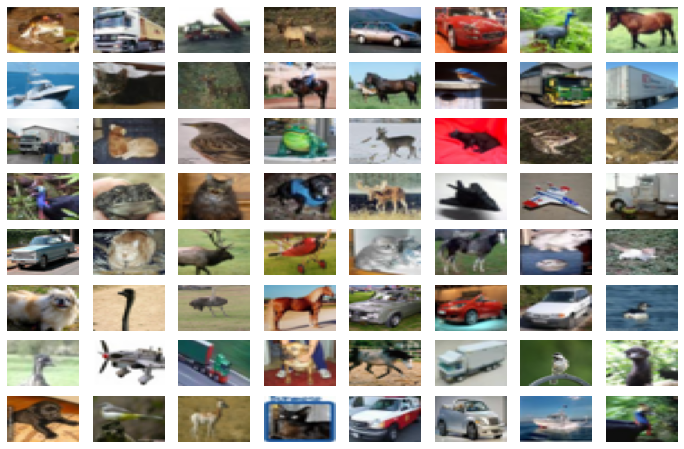

In [9]:
# Visualize the dataset

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [12, 8]

count = 8
fig, ax = plt.subplots(count, count)
k = 0
for i in range(count):
    for j in range(count):
        ax[i][j].imshow(train_images[k], aspect='auto')
        ax[i][j].axis('off')
        k += 1
 
plt.show()

# Training

In [10]:
#create callback; documentation: https://keras.io/api/callbacks/

filepath = 'best_model.hdf5'
checkpoint = keras.callbacks.ModelCheckpoint(filepath=filepath, 
                             monitor='val_loss',
                             verbose=1, 
                             save_best_only=True,
                             mode='min')

stop_early = keras.callbacks.EarlyStopping(patience=3)

In [11]:
# Logging with tensorboard
tensorboard = keras.callbacks.TensorBoard(
    log_dir="./log_directory",
)

# Train
epochs = 50
result = model.fit(train_images, 
          train_labels,
          epochs=epochs,  
          batch_size=128,
          validation_data=(test_images, test_labels),
         callbacks=[tensorboard])

Epoch 1/50
391/391 [==============================] - 64s 64ms/step - loss: 1.9703 - accuracy: 0.2883 - val_loss: 2.3266 - val_accuracy: 0.1000
Epoch 2/50
391/391 [==============================] - 21s 55ms/step - loss: 1.5342 - accuracy: 0.4346 - val_loss: 1.4627 - val_accuracy: 0.4658
Epoch 3/50
391/391 [==============================] - 21s 55ms/step - loss: 1.3681 - accuracy: 0.5056 - val_loss: 1.4682 - val_accuracy: 0.5132
Epoch 4/50
391/391 [==============================] - 22s 56ms/step - loss: 1.2566 - accuracy: 0.5475 - val_loss: 1.3738 - val_accuracy: 0.5332
Epoch 5/50
391/391 [==============================] - 23s 58ms/step - loss: 1.1485 - accuracy: 0.5891 - val_loss: 1.3568 - val_accuracy: 0.5555
Epoch 6/50
391/391 [==============================] - 22s 56ms/step - loss: 1.0630 - accuracy: 0.6231 - val_loss: 1.4880 - val_accuracy: 0.5514
Epoch 7/50
391/391 [==============================] - 21s 54ms/step - loss: 0.9945 - accuracy: 0.6495 - val_loss: 1.2155 - val_accuracy:

## TensorBoard

In [12]:
%load_ext tensorboard
%tensorboard --logdir  log_directory

Output hidden; open in https://colab.research.google.com to view.

In [13]:
#!kill 658

## Results

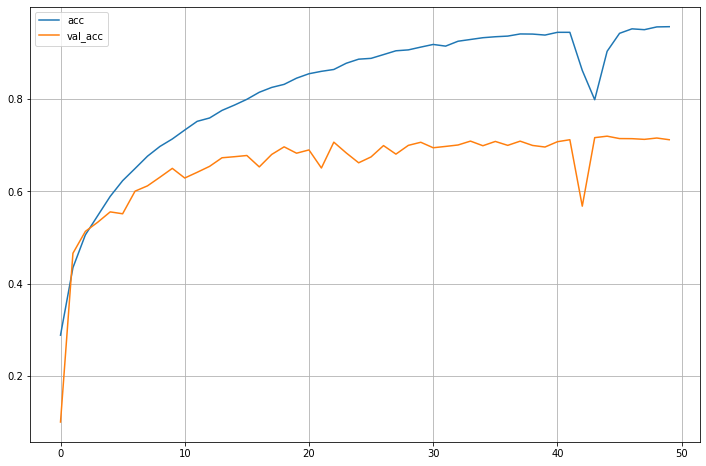

In [14]:
# Plot accuracy per iteration with Matplotlib

plt.plot(result.history['accuracy'], label='acc',)
plt.plot(result.history['val_accuracy'], label='val_acc')
plt.grid()
plt.legend()

1/1 [==============================] - 1s 1s/step
Ground truth: cat; Predicted: dog


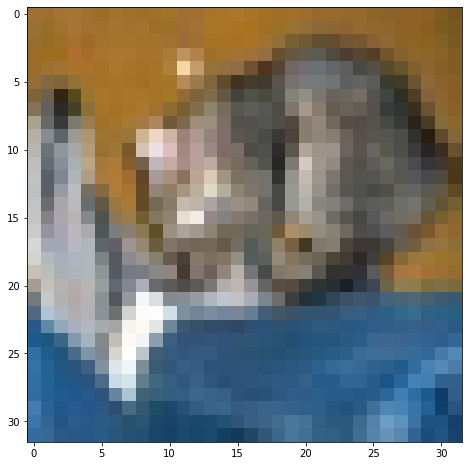

In [15]:
# label mapping
labels = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


def infer(image_number):
    # image_number - select the image from our test dataset
   
    # display the image
    plt.imshow(test_images[image_number]) 
    # load the image in an array
    n = np.array(test_images[image_number])
    # reshape it
    p = n.reshape(1, 32, 32, 3)
    # pass in the network for prediction and
    # save the predicted label
    predicted_label = labels[model.predict(p).argmax()]
    # load the original label
    true_label = labels[int(test_labels[image_number])]
    # display the result
    print(f"Ground truth: {true_label}; Predicted: {predicted_label}" )

infer(0)

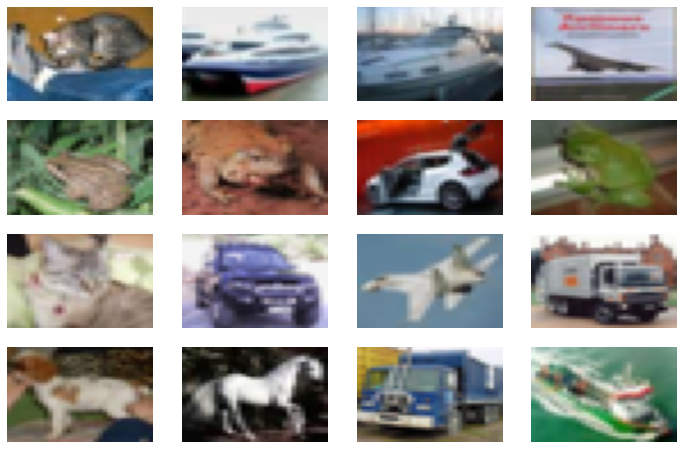

In [16]:
# Here are a few test images

count = 4
fig, ax = plt.subplots(count, count)
k = 0
for i in range(count):
    for j in range(count):
        ax[i][j].imshow(test_images[k], aspect='auto')
        ax[i][j].axis('off')
        k += 1
 
plt.show()

1/1 [==============================] - 0s 26ms/step
Ground truth: ship; Predicted: ship


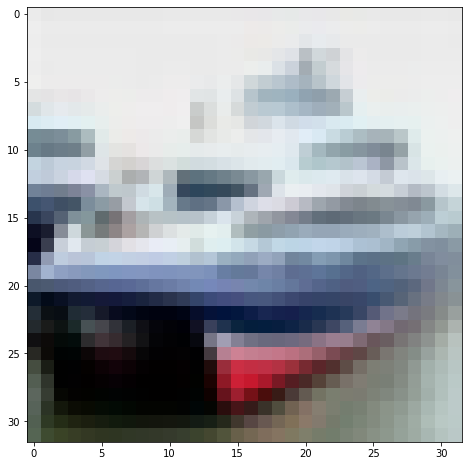

In [17]:
infer(1)

1/1 [==============================] - 0s 24ms/step
Ground truth: airplane; Predicted: airplane


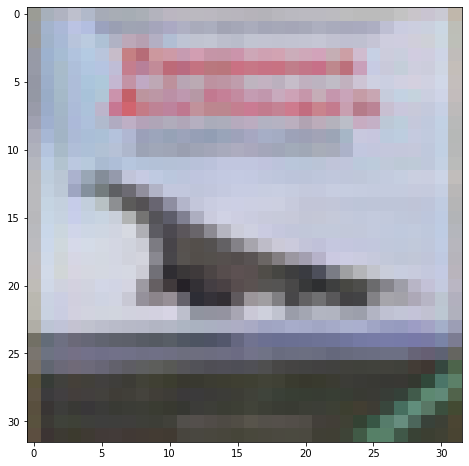

In [18]:
infer(3)

# Performance Metrics

## Training-Validation Plots

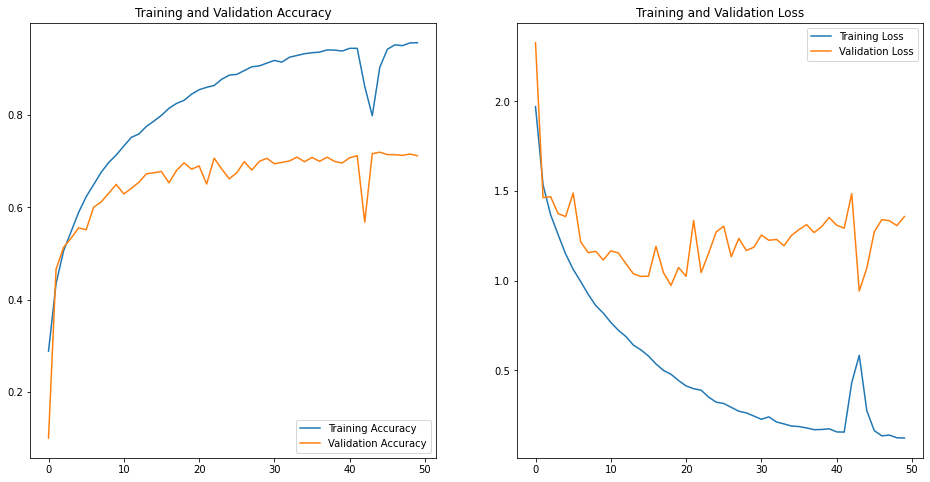

In [19]:
# Plot accuracy and loss with Matplotlib

epochs = epochs
acc = result.history['accuracy']
val_acc = result.history['val_accuracy']

loss = result.history['loss']
val_loss = result.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

## Confusion Matrix

313/313 [==============================] - 3s 9ms/step


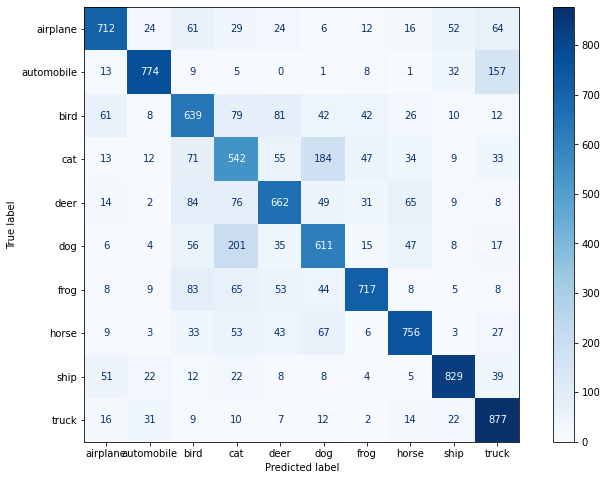

In [20]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import numpy as np


test_predictions =  np.argmax(model.predict(test_images), axis=1)
cm = confusion_matrix(test_labels, test_predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
disp.plot(cmap=plt.cm.Blues)
plt.show()

## Classification Report

In [21]:
from sklearn.metrics import classification_report

print(classification_report(test_labels, test_predictions, target_names=labels))

              precision    recall  f1-score   support

    airplane       0.79      0.71      0.75      1000
  automobile       0.87      0.77      0.82      1000
        bird       0.60      0.64      0.62      1000
         cat       0.50      0.54      0.52      1000
        deer       0.68      0.66      0.67      1000
         dog       0.60      0.61      0.60      1000
        frog       0.81      0.72      0.76      1000
       horse       0.78      0.76      0.77      1000
        ship       0.85      0.83      0.84      1000
       truck       0.71      0.88      0.78      1000

    accuracy                           0.71     10000
   macro avg       0.72      0.71      0.71     10000
weighted avg       0.72      0.71      0.71     10000



In [22]:
#- mkc & vbc